# Занятие 3 (продолжение)

### Материал Находнова Максима

## `Блоки нейронных сетей`

### `torch.nn.Module`

Для того, чтобы реализовать свой блок, нужно, чтобы он был отнаследован от базового класса для всех нейронных сетей `torch.nn.Module`. 

Затем, для удобства и в соответствии с общепринятой практикой, модуль должен реализовывать функцию `forward`.  В этой функции обычно реализуют основную логику вычислений в модуле, так называемый *прямой проход* через слой. Pytorch использует функцию `forward` для переопределения магического метода класса `__call__`, что позволяет использовать следующий синтаксический сахар для вычисления прямого прохода:
```python
# Два эквивалентных способа делать прямой проход через блок:
out = module(x)
out = module.forward(x)
```

Нужно отметить, что блоки являются лишь удобной обёрткой для вычислений и создания графа автоматического дифференцирования.

Рассмотрим простейший пример модуля, который реализует **Тождественное преобразование**:

In [1]:
import torch

In [2]:
class Identity(torch.nn.Module):
    def __init__(self):
        '''
        Конструктор блока. Здесь обычно создают обучаемые параметры и сохраняют переменные, 
            определяющие глобальное состояние слоя, а так же гиперпараметры
        Блок, может содержать в себе подблоки, которые также были отнаследованы от базового класса torch.nn.Module
        '''
        # Необходимо вызвать конструктор базового класса для корректной работы блока
        super().__init__()
        
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        '''
        Функция, реализующая прямой проход через слой. В процессе вычислений создаётся граф вычислений
            сквозь который выполняется автоматическое дифференцирование.
        '''
        return x
    
    def __repr__(self):
        '''
        Хорошей практикой является переопределение строкового представления для блоков
        Обычно, помимо названия класса также выводят гиперпараметры данного экземпляра класса
        '''
        return 'Identity()'

Создадим экземпляр данного слоя и проверим его работу:

In [3]:
identity_layer = Identity()
x = torch.randn([3, 5])

# Обратите внимание, метод __call__ был автоматически переопределён через вызов метода forward
print(x, identity_layer(x), sep='\n')
print(identity_layer, torch.equal(x, identity_layer(x)))

tensor([[-0.1040, -0.4454,  0.6592, -0.1265,  0.5433],
        [-0.8450, -0.0133, -0.5723,  1.3380,  1.7952],
        [-0.7519,  1.1772,  0.1882,  0.1609,  0.3563]])
tensor([[-0.1040, -0.4454,  0.6592, -0.1265,  0.5433],
        [-0.8450, -0.0133, -0.5723,  1.3380,  1.7952],
        [-0.7519,  1.1772,  0.1882,  0.1609,  0.3563]])
Identity() True


#### `Параметры/буфферы`

Далее реализуем полносвязный слой без нелинейности `Linear`. У слоя два параметра: **матрица весов** и **вектор сдвига**. 

Основным преимуществом базового класса `torch.nn.Module` является наличие интерфейса работы с параметрами (обучаемые веса модели), буферами (необучаемые тензоры в модели) и подмодулями (то есть другие модули-наследники `torch.nn.Module`, которые в итоге создают иерархическую структуру модели).

Если параметры/буферы/подмодули зарегистрированы в модуле, то базовый класс позволяет удобно работать с этими сущностями. Рассмотрим основные методы:
* `parameters` — возвращает итератор по всем параметрам, зарегистрированным в данном модуле и всех его подмодулях
* `named_parameters` — возвращает итератор по всем параметрам и их именам, зарегистрированным в данном модуле и всех его подмодулях
* `buffers`/`named_buffers` — аналогичные функции для получения доступа к списку всех буферов
* `requires_grad_(requires_grad=True)` — in-place метод, включающий или выключающий подсчёт градиентов для параметров
* `to(device, dtype)` — изменение типа параметров и устройства на котором они располагаются
* `train`/`eval` — рекурсивное переключение режимов работы модулей. Обычно, перед обучением сети необходимо вызвать метод `train`, а перед тестированием (инференсом) — перевести в режим `eval`. Данные методы необходимы для корректной реализации таких методов регуляризации как BatchNorm и Dropout

Подробное описание работы этих и других доступных методов можно найти в [документации](https://pytorch.org/docs/stable/generated/torch.nn.Module.html).

Теперь рассмотрим процесс регистрации параметров/буферов/подмодулей.
Существует два основных варианта регистрации:
1. **Неявная регистрация**, которая происходит в момент создания атрибута класса и присваивания ему класса-обёртки для параметров `torch.nn.Parameter` (для регистрации параметров) или наследника `torch.nn.Module` (для регистрации подмодулей). Обратите внимание, что **присваивание тензора не приводит к регистрации параметра**. Также, стоит отметить, что нет неявного способа регистрации буферов
2. **Явная регистрация** с использованием методов `register_parameter, register_buffer, register_module`.

По умолчанию при написании кода стоит отдавать предпочтение *неявной регистрации*.

Отдельно выделим частую ситуацию, в которой требуется зарегистрировать переменное (или просто достаточно большое число) параметров/подмодулей. Действительно, в современных моделях может быть десятки и сотни слоёв и тысячи тензоров-параметров, которые логично хранить в модели не в виде отдельных атрибутов, а в виде списка или словаря. Однако, сохранив параметры/подмодули в такую структуру данных, **неявная регистрация автоматически не сработает**. Чтобы обойти этот недостаток в **Pytorch** реализован набор контейнеров, которые при добавлении в них параметров будут производить их регистрацию в текущем блоке. Так, например, доступен контейнер для списка параметров `torch.nn.ParameterList` и контейнер для словаря параметров `torch.nn.ParameterDict`. Аналогичные [классы-контейнеры](https://pytorch.org/docs/stable/nn.html#containers) доступны и для модулей: `torch.nn.ModuleList`, `torch.nn.ModuleDict`. При реализации слоёв с фиксированным числом параметров (например, `Linear`) такие классы обычно не нужны.

Сразу обратим внимание на особо важный момент при работе с обучаемыми параметрами. Качество итоговой модели и процесс обучения может существенно зависеть от начальной инициализации параметров. Поэтому, **необходимо тщательно контролировать инициализацию**. В **Pytorch** общепринятым способом установки блока в исходное состояние является реализация метода `reset_parameters`, который выполняет правильную инициализацию обучаемых весов, отчищает буферы и так далее.

In [26]:
class Linear(torch.nn.Module):
    def __init__(self, in_features, out_features):
        '''
        Полносвязный слой — это слой выполняющий аффинное преобразование f(x) = x W + b
        '''
        super().__init__()
        
        # Создайте необходимые обучаемые параметры
        ### your code here
        self.weight = torch.nn.Parameter(
            torch.randn(in_features, out_features, requires_grad=True)
        )
#         self.bias = torch.randn(out_features, requires_grad=True)
        self.register_parameter(
            'bias', 
            torch.nn.Parameter(torch.randn(out_features))
        )
        self.in_features = in_features
        self.out_features = out_features
        # Выполните инициализацию весов
        ### your code here
        
    def reset_parameters(self):
        '''
        Инициализация весов полносвязного слоя из нормального распределения с 
            нулевым средним и стандартным отклонением 0.01
        Вектор-смещение инициализируется нулями
        '''
        ### your code here

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        '''
        Выполнение аффинного преобразования f(x) = x W + b
        
        :param torch.Tensor x: входная матрица размера [batch_size, in_features]
        :returns: матрица размера [batch_size, out_features]
        '''
        ### your code here
        
    def __repr__(self):
        '''
        Опциональный метод для красивого вывода
        '''
        return 'Linear({0:d}, {1:d})'.format(*self.weight.shape)

In [27]:
linear_layer = Linear(3, 5)

In [28]:
list(linear_layer.named_parameters())

[('weight', Parameter containing:
  tensor([[ 0.4386, -1.0861,  0.3153, -0.6312, -1.3726],
          [-0.4139, -2.1680, -2.2982,  0.8400,  0.4962],
          [ 0.3882, -0.1498, -0.3647,  2.3526,  0.0332]], requires_grad=True)),
 ('bias', Parameter containing:
  tensor([ 0.3497, -0.4913, -0.6277,  1.5047,  0.5840], requires_grad=True))]

In [19]:
linear_layer = Linear(3, 5)
x = torch.randn([2, 3])

print(x, linear_layer(x), sep='\n')
print(linear_layer)

tensor([[ 1.2417, -1.1470,  3.0437],
        [-1.2564, -1.7330, -0.7838]])
tensor([[-3.7714,  2.9894,  0.7635, -1.0533,  2.7692],
        [ 1.0048,  3.6573, -1.1292,  0.5709,  0.2429]], grad_fn=<AddBackward0>)
Linear(3, 5)


Блоки-наследники `torch.nn.Module` автоматически сохраняют информацию о своей структуре: параметрах, буферах. Например, можно получить генератор всех параметров в данном блоке (метод `parameters`). Более того, каждый параметр имеет своё уникальное имя (обычно оно совпадает с названием переменной, в которую соответствующий параметр был присвоен). Именованный список параметров можно получить через вызов метода `named_parameters`:

In [20]:
linear_layer, list(linear_layer.parameters()), list(linear_layer.named_parameters())

(Linear(3, 5), [Parameter containing:
  tensor([[-1.0742, -1.0257,  0.7864, -0.4625, -0.1150],
          [ 1.0208, -1.8386,  0.5152,  0.2027, -0.3197],
          [-0.7030,  0.7764, -0.0977, -0.1535,  0.7840]], requires_grad=True),
  Parameter containing:
  tensor([ 0.8732, -0.2090,  0.6752,  0.2207,  0.1589], requires_grad=True)], [('weight',
   Parameter containing:
   tensor([[-1.0742, -1.0257,  0.7864, -0.4625, -0.1150],
           [ 1.0208, -1.8386,  0.5152,  0.2027, -0.3197],
           [-0.7030,  0.7764, -0.0977, -0.1535,  0.7840]], requires_grad=True)),
  ('bias', Parameter containing:
   tensor([ 0.8732, -0.2090,  0.6752,  0.2207,  0.1589], requires_grad=True))])

#### `Функции потерь`

Функции потерь иногда наследуют от базового класса `torch.nn.Module`, но часто сам слой не включают в нейронную сеть.

#### `Сборка нейронной сети`

Для создания моделей из набора слоёв в **Pytorch** обычно используется следующий иерархический подход. Внутри каждого блока, отнаследованного от `torch.nn.Module`, могут содержаться другие слои, так же отнаследованные от `torch.nn.Module`. Как описывалось ранее, подмодули/параметры/буферы имеют два способа регистрации — неявный (через присваивание атрибута класса) и явный (в случае модулей, через метод `register_module`).

Для решения проблемы регистрации списков/словарей модулей **Pytorch** реализует контейнеры с поддержкой автоматической регистрации. Как и для параметров, существует несколько таких контейнеров:
* `torch.nn.ModuleList` — хранит список модулей
* `torch.nn.ModuleDict` — хранит словарь модулей
* `torch.nn.Sequential` — особый контейнер, который хранит список модулей и позволяет последовательно применить модули из списка к объекту, поданному ему на вход

### `torch.optim`

Для градиентной оптимизации в **Pytorch** реализовано множество оптимизаторов. 

Большинство оптимизаторов в **Pytorch** отнаследовано от базового класса `torch.optim.Optimizer` и имеют следующий вид:
```python

class OptimizerExample(torch.optim.Optimizer):
    def __init__(self, params, **hyperparameters):
        '''
        Конструктор оптимизатора
        
        :param params: список или генератор обучаемых параметров модели
        :param hyperparameters: различные гиперпараметры оптимизатора, например, темп обучения
        '''
        super().__init__(params, hyperparameters)
    
        
    def step(self, closure=None):
        '''
        Функция, выполняющая шаг оптимизации, используя градиенты, сохранённые в тензорах self.params
        '''
        ...
        
    def zero_grad(self):
        '''
        Функция, очищающая градиенты, сохранённые в тензорах self.params
        '''
        ...
```

Отметим, что оптимизаторы в **Pytorch** обычно не управляют подсчётом градиентов, а лишь используют значения атрибута  `grad` у обучаемых параметров. Это позволяет разделить вычисление функции потерь, вычисление градиентов и сам шаг оптимизации на отдельные компоненты, что делает код более читаемым.

Большинство оптимизаторов поддерживают два способа использования:
1. Упрощённый способ, в котором метод `step` используется после того, как были посчитаны градиенты (например, через вызов `backward`)
2. Подвинутый способ, в котором подсчёт градиентов инкапсулирован в функцию `closure`, которая передаётся в метод `step` единственным параметром. Есть как минимум два аргумента в пользу такого варианта:
    * Такой подход позволяет явно выделить в коде отдельную функцию, которая считает градиенты модели, что улучшает читаемость кода
    * Некоторые оптимизаторы (например, реализующие алгоритмы LBFGS и Метод Сопряжённых Градиентов) требуют многократного подсчёта градиентов для выполнения одного шага оптимизации, что реализовано через выделение отдельной функции для подсчёта градиентов
    
Таким образом, функция `closure` выполняет следующие действия:
1. Отчищает градиенты обучаемых параметров, например, через вызов метода `zero_grad` у оптимизатора
2. Вычисляет функцию потерь и её градиент
3. Возвращает значение функции потерь


Пример SOTA оптимизатора:

In [ ]:
from typing import Tuple, Optional, Callable


def update_fn(p, grad, exp_avg, lr, wd, beta1, beta2):
    # stepweight decay
    p.data.mul_(1 - lr * wd)

    # weight update
    update = exp_avg.clone().mul_(beta1).add(grad, alpha=1 - beta1).sign_()
    p.add_(update, alpha = -lr)

    # decay the momentum running average coefficient
    exp_avg.mul_(beta2).add_(grad, alpha=1 - beta2)


class Lion(torch.optim.Optimizer):
    def __init__(
        self, params,
        lr: float = 1e-4,
        betas: Tuple[float, float] = (0.9, 0.99),
        weight_decay: float = 0.0,
    ):
        assert lr > 0.
        assert all([0. <= beta <= 1. for beta in betas])

        defaults = dict(
            lr=lr, betas=betas,
            weight_decay=weight_decay
        )

        super().__init__(params, defaults)

        self.update_fn = update_fn


    @torch.no_grad()
    def step(self, closure: Optional[Callable] = None):
        loss = None
        if closure is not None:
            with torch.enable_grad():
                loss = closure()

        for group in self.param_groups:
            for p in filter(lambda p: p.grad is not None, group['params']):

                grad, lr, wd, beta1, beta2, state = (
                    p.grad, group['lr'], group['weight_decay'], *group['betas'], self.state[p]
                )

                # init state - exponential moving average of gradient values

                if len(state) == 0:
                    state['exp_avg'] = torch.zeros_like(p)

                exp_avg = state['exp_avg']

                self.update_fn(p, grad, exp_avg, lr, wd, beta1, beta2)

        return loss

### `Загрузка и предобработка данных`

Pytorch реализует готовый набор классов и функций для работы с наборами данных. Обычно, при работе с **Pytorch** датасет представляют в виде наследника класса `torch.utils.data.Dataset`:
```python
class DatasetExample(torch.utils.data.Dataset):
    def __init__(self):
        super().__init__()
        
    def __getitem__(self, idx):
        '''
        Возвращает элемент датасета по его индексу
        :param int idx: Номер элемента в датасете
        :returns: Объект из выборки с порядковым номером idx
        '''
        ...
        
    def __len__(self):
        '''
        Опциональный метод, возвращает число элементов в датасете
        '''
        ...
```

Попробуем создать датасет для модельных данных [mobile-price-classification](https://www.kaggle.com/datasets/iabhishekofficial/mobile-price-classification):

In [30]:
! kaggle datasets download -d iabhishekofficial/mobile-price-classification

! unzip -o mobile-price-classification.zip -d mobile-price-classification
! rm -rf mobile-price-classification.zip

Traceback (most recent call last):
  File "/usr/local/bin/kaggle", line 5, in <module>
    from kaggle.cli import main
  File "/usr/local/lib/python3.8/dist-packages/kaggle/__init__.py", line 23, in <module>
    api.authenticate()
  File "/usr/local/lib/python3.8/dist-packages/kaggle/api/kaggle_api_extended.py", line 164, in authenticate
    raise IOError('Could not find {}. Make sure it\'s located in'
OSError: Could not find kaggle.json. Make sure it's located in /root/.kaggle. Or use the environment method.
unzip:  cannot find or open mobile-price-classification.zip, mobile-price-classification.zip.zip or mobile-price-classification.zip.ZIP.


In [31]:
import pandas as pd

In [32]:
pd.read_csv('./train.csv')

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,794,1,0.5,1,0,1,2,0.8,106,6,...,1222,1890,668,13,4,19,1,1,0,0
1996,1965,1,2.6,1,0,0,39,0.2,187,4,...,915,1965,2032,11,10,16,1,1,1,2
1997,1911,0,0.9,1,1,1,36,0.7,108,8,...,868,1632,3057,9,1,5,1,1,0,3
1998,1512,0,0.9,0,4,1,46,0.1,145,5,...,336,670,869,18,10,19,1,1,1,0


In [34]:
class MobilePriceDataset(torch.utils.data.Dataset):
    def __init__(self, path):
        super().__init__()
        
        self.data = pd.read_csv(path)
        self.X = self.data.drop(['price_range'], axis=1)
        self.y = self.data['price_range']

    def __getitem__(self, idx):
        '''
        Возвращает элемент датасета по его индексу
        :param int idx: Номер элемента в датасете
        :returns: Объект из выборки с порядковым номером idx
        '''
        return torch.tensor(self.X.iloc[idx]), torch.tensor(self.y.iloc[idx], dtype=torch.long)
        
    def __len__(self):
        '''
        Опциональный метод, возвращает число элементов в датасете
        '''
        return len(self.data)

In [36]:
ds = MobilePriceDataset('./train.csv')

ds[0]

(tensor([8.4200e+02, 0.0000e+00, 2.2000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00,
         7.0000e+00, 6.0000e-01, 1.8800e+02, 2.0000e+00, 2.0000e+00, 2.0000e+01,
         7.5600e+02, 2.5490e+03, 9.0000e+00, 7.0000e+00, 1.9000e+01, 0.0000e+00,
         0.0000e+00, 1.0000e+00], dtype=torch.float64), tensor(1))

In [ ]:
ds_train, ds_test = torch.utils.data.random_split(
    ds, 
    lengths=[int(len(ds) * 0.7), len(ds) - int(len(ds) * 0.7)]
)

ds_test[0]

На практике обычно используют стохастические методы оптимизации, которые используют батчи объектов, семплированных из обучающей выборки. Хотя перемешивание и объединение в батчи объектов из датасета можно проводить вручную, **Pytorch** позволяет делать эти операции значительно более эффективно. Для этого обычно используют класс, который преобразует датасет в генератор батчей `torch.utils.data.DataLoader`. Данная обёртка позволяет объединять объекты в один батч, то есть объединять соответствующие тензоры в каждом объекте (например, изображения и соответствующие метки).

Основные параметры даталоадера:
- `batch_size` — размер подвыборки, семплируемый при каждом обращении к инстансту
- `shuffle` — перемешивать выборку или нет
- `num_workers` — ключевой параметр, который определяет производительность генератора батчей. Опишем влияние этого параметра подробнее. В процессе генерации очередного батча даталоадер должен выполнить несколько медленных процедур: запрос объектов из соответствующего датасета, что часто включает в себя чтение из жёсткого диска (так как большие датасеты не помещаются в оперативную память), применение трансформаций ко всем изображениям и конкатенация отдельных объектов в один тензор. Часто оказывается так, что вычисление прямого прохода по сети происходит быстрее, чем генерируется очередной батч, что приводит к существенно неэффективной программе. В таком случае, необходимо увеличить число параллельных процессов, каждый из которых генерирует очередной батч данных. На практике, выбор правильного числа воркеров может давать кратный прирост в скорости (обычно, перебор начинают с $3-4$ воркеров) 

In [ ]:
dl_train = torch.utils.data.DataLoader(
    ds_train, batch_size=8, num_workers=0
)
dl_test = torch.utils.data.DataLoader(
    ds_test, batch_size=8, num_workers=0
)
next(iter(dl_train))

# Занятие 4: Обучений нейросетей на pytorch

### Практикум на ЭВМ для 317 группы, ВМК МГУ, кафедра ММП

### Афанасьев Глеб, кафедра ММП ВМК МГУ

#### За основу взяты материалы Варламовой Арины, кафедра ММП ВМК МГУ


В данном ноутбуке рассмотрены некоторые аспекты обучения нейросетей с помощью библиотеки Pytorch. Эксперименты проводятся на датасете CIFAR10. 

Официальные туториалы pytorch по этим темам:

* [Neural networks](https://pytorch.org/tutorials/beginner/blitz/neural_networks_tutorial.html#sphx-glr-beginner-blitz-neural-networks-tutorial-py)

* [Training a classifier](https://pytorch.org/tutorials/beginner/blitz/cifar10_tutorial.html#sphx-glr-beginner-blitz-cifar10-tutorial-py)

## Теория

Свертка 2d изображения - аггрегация данных об интенсивности пикселей на изображении в соответствии с определенным набором правил.

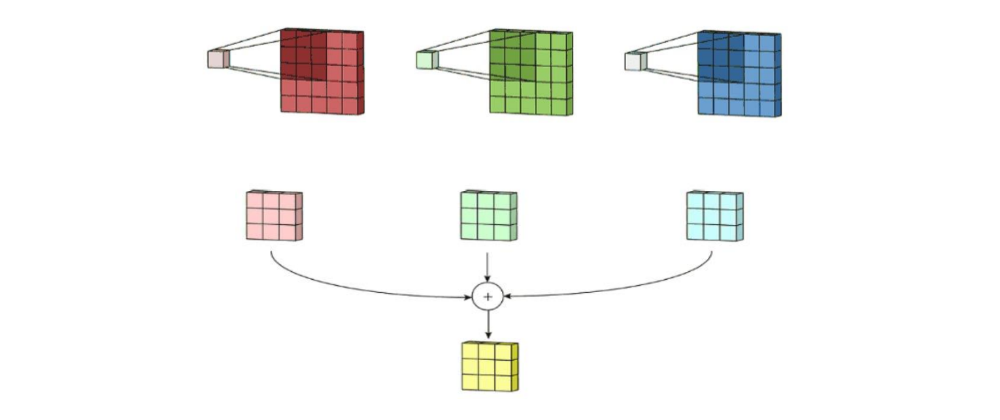

Операция свертки многоканального изображения K с ядром U:​

$V(x,y,t) = ∑_{i=x-δ}^{x-δ} ∑_{j=y-δ}^{y-δ}∑_{s=1}^{S} K(i-x+δ,j-y+δ,s,t)U(i,j,s)$

### Свертка в PyTorch

In [ ]:
import torch

In [ ]:
?torch.nn.Conv2d

In [ ]:
class torch.nn.Conv2d(in_channels, out_channels, kernel_size,
                      stride=1, padding=0, dilation=1, groups=1,
                      bias=True, padding_mode='zeros', device=None,
                      dtype=None)

In [ ]:
conv = torch.nn.Conv2d(1, 1, 3, stride=1, bias=False)

#### **Параметры Conv2d**

In [ ]:
conv.weight

Parameter containing:
tensor([[[[ 0.1800,  0.2638,  0.0015],
          [ 0.2660,  0.2561, -0.1970],
          [-0.2344,  0.0366,  0.1943]]]], requires_grad=True)

Для наглядности насильно переопределим веса

In [ ]:
conv.load_state_dict({'weight': torch.tensor([[[[1.,  1.,  1.],
                                                [1.,  1.,  1.],
                                                [1.,  1.,  1.]]]], requires_grad=True)}, strict=False)

<All keys matched successfully>

In [ ]:
conv.weight

Parameter containing:
tensor([[[[1., 1., 1.],
          [1., 1., 1.],
          [1., 1., 1.]]]], requires_grad=True)

In [ ]:
ExperimentalTensor =torch.tensor([[[[1., 1., 1., 1., 1.],
                                    [1., 1., 1., 1., 1.],
                                    [1., 1., 1., 1., 1.],
                                    [1., 1., 1., 1., 1.],
                                    [1., 1., 1., 1., 1.]]]])

In [ ]:
conv(ExperimentalTensor)

tensor([[[[9., 9., 9.],
          [9., 9., 9.],
          [9., 9., 9.]]]], grad_fn=<ConvolutionBackward0>)

**Stride:**

Определяет шаг, с которым ядро свертки проходит по матрице

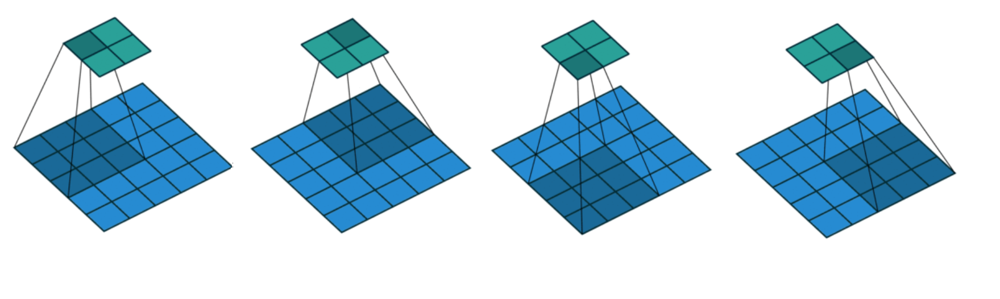

In [ ]:
conv = torch.nn.Conv2d(1, 1, 3, stride=2, bias=False)
conv.load_state_dict({'weight': torch.tensor([[[[1.,  1.,  1.],
                                                [1.,  1.,  1.],
                                                [1.,  1.,  1.]]]], requires_grad=True)}, strict=False)

<All keys matched successfully>

In [ ]:
conv(ExperimentalTensor)

tensor([[[[9., 9.],
          [9., 9.]]]], grad_fn=<ConvolutionBackward0>)

**Padding:**

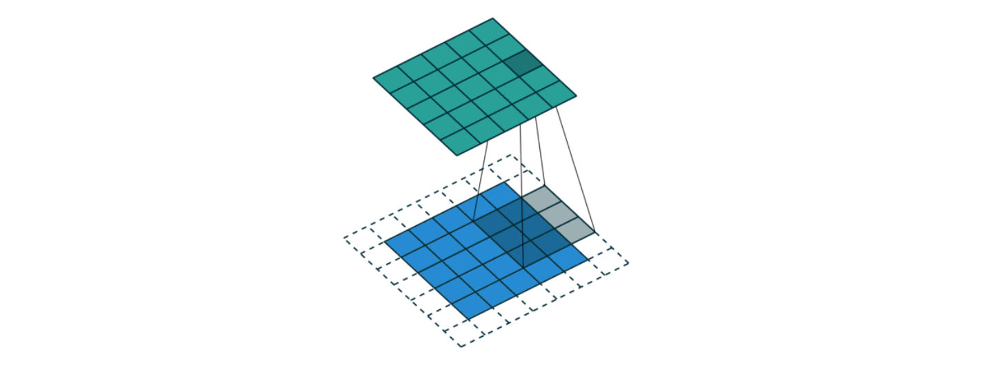

In [ ]:
conv = torch.nn.Conv2d(1, 1, 3, padding=1, bias=False, padding_mode='zeros')
conv.load_state_dict({'weight': torch.tensor([[[[1.,  1.,  1.],
                                                [1.,  1.,  1.],
                                                [1.,  1.,  1.]]]], requires_grad=True)}, strict=False)

<All keys matched successfully>

In [ ]:
conv(ExperimentalTensor)

tensor([[[[4., 6., 6., 6., 4.],
          [6., 9., 9., 9., 6.],
          [6., 9., 9., 9., 6.],
          [6., 9., 9., 9., 6.],
          [4., 6., 6., 6., 4.]]]], grad_fn=<ConvolutionBackward0>)

**Dilation:**

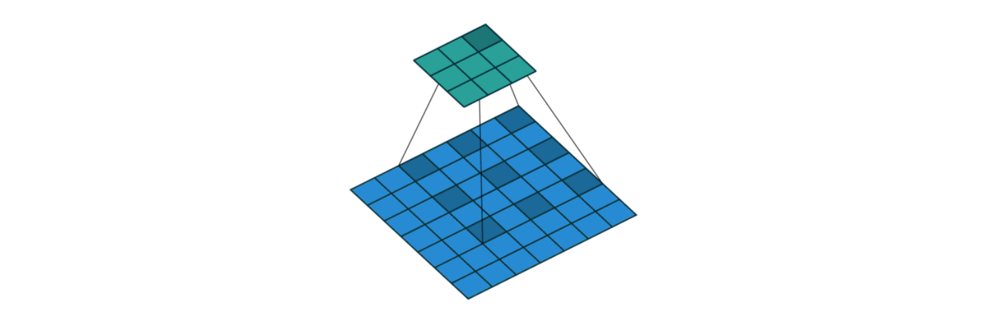

In [ ]:
conv = torch.nn.Conv2d(1, 1, 3, dilation=2, bias=False, padding_mode='zeros')
conv.load_state_dict({'weight': torch.tensor([[[[1.,  1.,  1.],
                                                [1.,  1.,  1.],
                                                [1.,  1.,  1.]]]], requires_grad=True)}, strict=False)

<All keys matched successfully>

In [ ]:
conv(ExperimentalTensor)

tensor([[[[9.]]]], grad_fn=<ConvolutionBackward0>)

Какой будет результат выполнения следующего кода?

In [ ]:
conv = torch.nn.Conv2d(1, 1, 3, padding=3, stride=2, bias=False, padding_mode='zeros')
conv.load_state_dict({'weight': torch.tensor([[[[1.,  1.,  1.],
                                                [1.,  1.,  1.],
                                                [1.,  1.,  1.]]]], requires_grad=True)}, strict=False)

<All keys matched successfully>

In [1]:
conv(ExperimentalTensor)

****

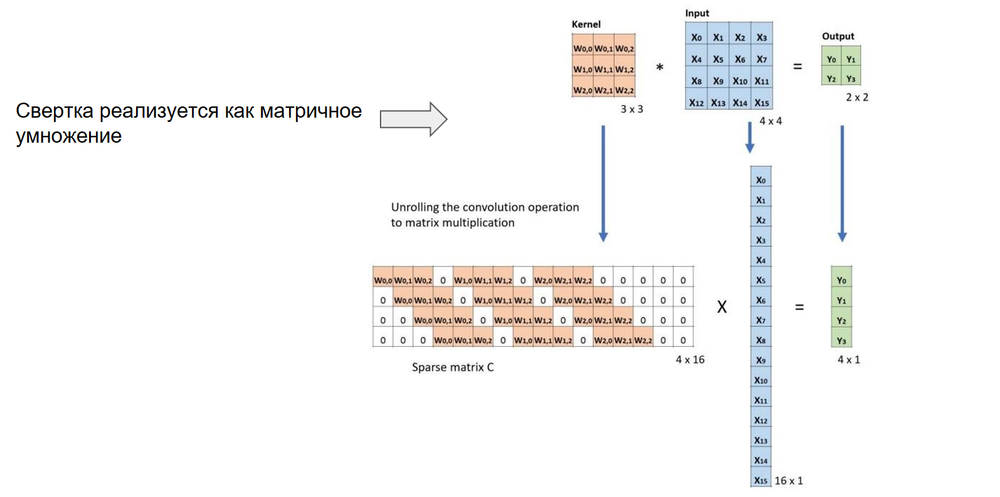

#### Примеры сверток

In [ ]:
from PIL import Image
import requests
from io import BytesIO
import numpy as np
import matplotlib.pyplot as plt
from torchvision.transforms.functional import pil_to_tensor
from PIL import ImageFilter
import torchvision
response = requests.get('https://avatars.dzeninfra.ru/get-zen_gallery/3006251/pub_5f817c46b1a4d95dc065dbe4_5f817c6a109c65627e4fac5d/scale_1200')
img = Image.open(BytesIO(response.content))
img = img.resize((400, 400))

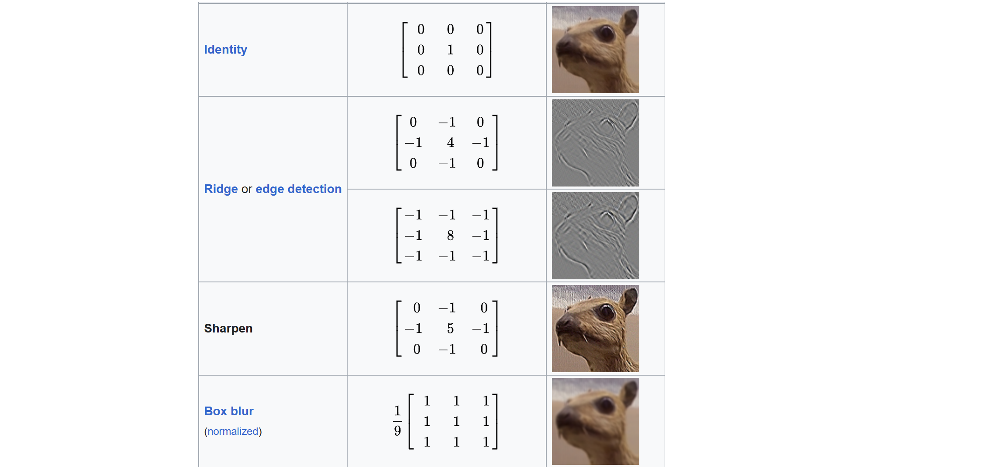

In [ ]:
im1 = img.filter(ImageFilter.BLUR)
im1

In [ ]:
im2 = img.filter(ImageFilter.MinFilter(3))
im2

In [ ]:
im2 = img.filter(ImageFilter.FIND_EDGES)
im2

### Pooling Layers

Как увеличить зону покрытия свертки?


*   Dilation
*   Больше сверток
*   Pooling



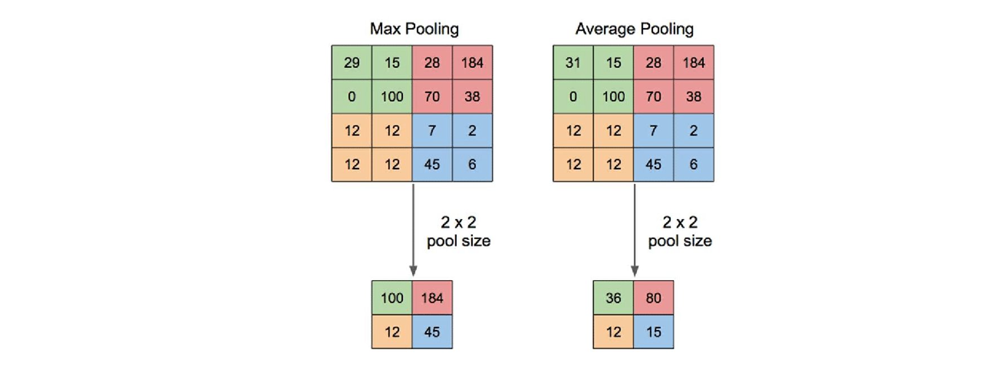

In [ ]:
?torch.nn.MaxPool2d

In [ ]:
ExperimentalTensor = torch.randint(0, 100, (4,4))
ExperimentalTensor = ExperimentalTensor[None, None, :, :].float()

In [ ]:
ExperimentalTensor

tensor([[[[56., 27., 42., 99.],
          [67., 57., 79., 89.],
          [35., 16., 83., 67.],
          [93., 77., 56., 86.]]]])

In [ ]:
pooling = torch.nn.MaxPool2d(2)
pooling(ExperimentalTensor)

tensor([[[[67., 99.],
          [93., 86.]]]])

## Простая схема сверточной сети для классификации

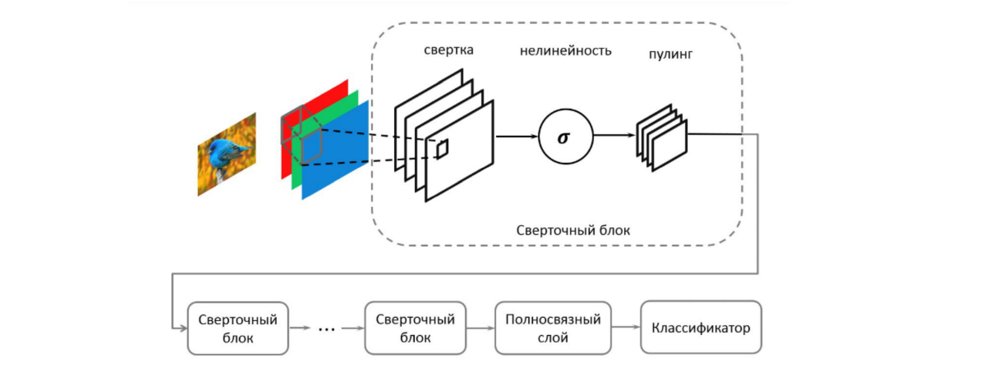

Классические архитектуры сверточных сетей для 
классификации


*   AlexNet
*   VGG
*   Inception
*   ResNet
*   https://pytorch.org/vision/0.8/models.html



### Архитектура AlexNet

![title](https://machinelearningmastery.ru/img/0-538121-698201.png)

In [ ]:
torchvision.models.alexnet

<function torchvision.models.alexnet.alexnet(*, weights: Union[torchvision.models.alexnet.AlexNet_Weights, NoneType] = None, progress: bool = True, **kwargs: Any) -> torchvision.models.alexnet.AlexNet>

### Архитектура VGG16

![title](https://images.deepai.org/converted-papers/2003.05096/vgg16.png)

In [ ]:
torchvision.models.vgg16

<function torchvision.models.vgg.vgg16(*, weights: Union[torchvision.models.vgg.VGG16_Weights, NoneType] = None, progress: bool = True, **kwargs: Any) -> torchvision.models.vgg.VGG>

### Аугментация

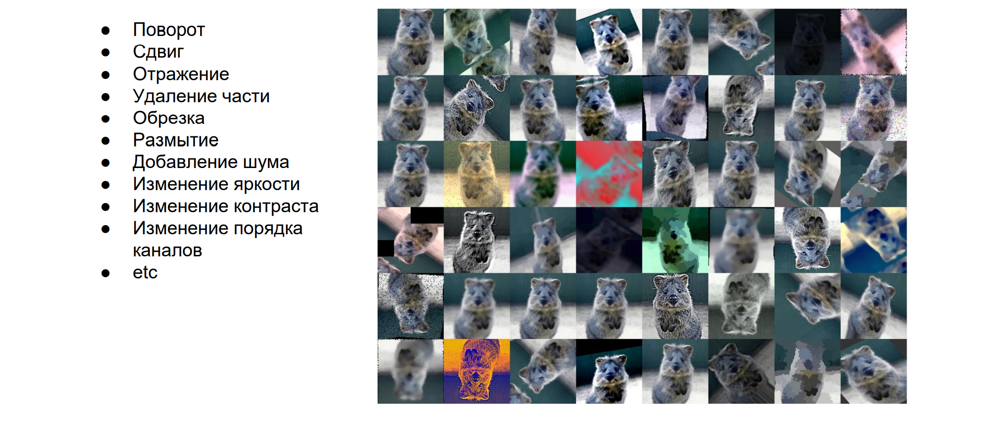

### Окклюзия изображений

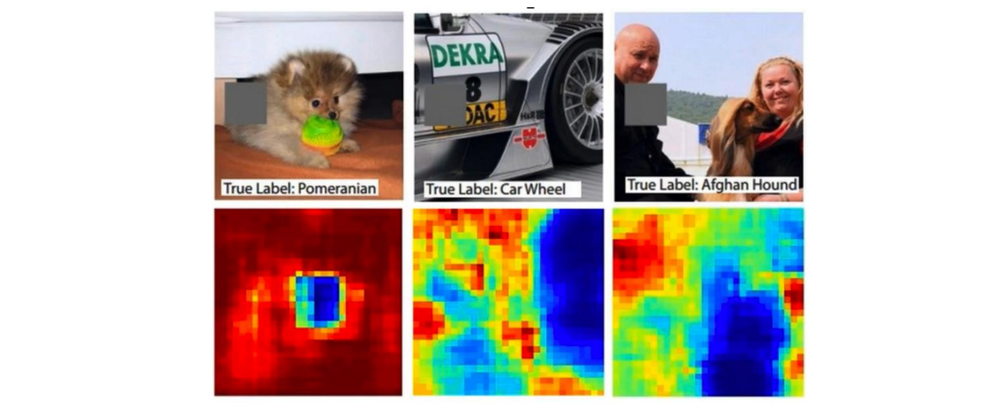

### Чувствительность фильтров

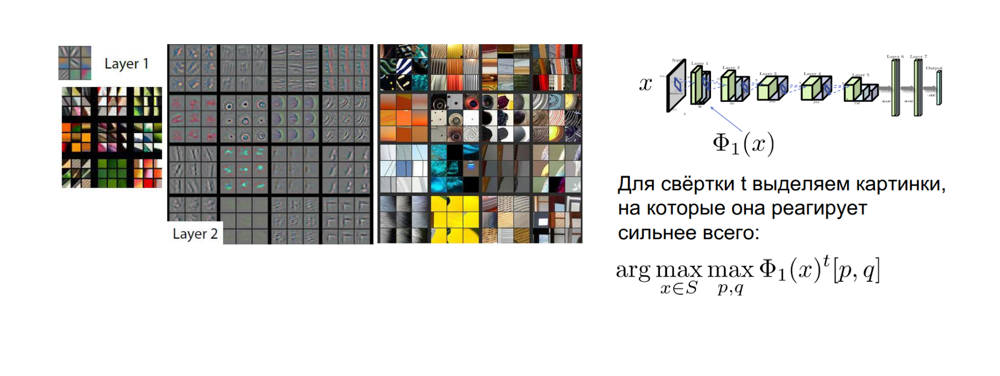

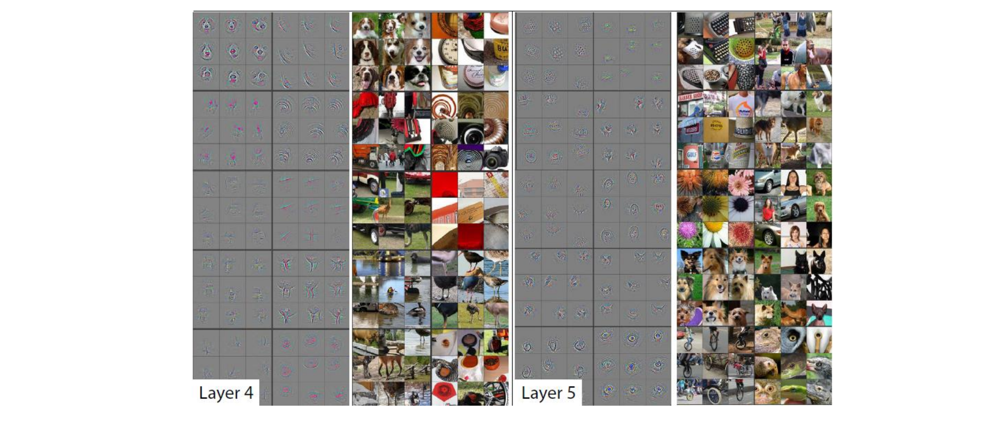

In [ ]:
import matplotlib.pyplot as plt
plt.style.use('classic')

from IPython import display

import numpy as np

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

import torchvision
import torchvision.transforms as transforms

from torch.utils.data import DataLoader

### Загрузка данных

Загрузим датасет CIFAR10 с помощью стандартной функции из torchvision. При загрузке датасета используем преобразование, нормализующее каналы изображения.

In [ ]:
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

In [ ]:
trainset = torchvision.datasets.CIFAR10(root='./data', train=True,
                                        download=True, transform=transform)

Files already downloaded and verified


In [ ]:
testset = torchvision.datasets.CIFAR10(root='./data', train=False,
                                       download=True, transform=transform)

Files already downloaded and verified


In [ ]:
classes = ('plane', 'car', 'bird', 'cat',
           'deer', 'dog', 'frog', 'horse', 'ship', 'truck')

Создадим итераторы по данным:

In [ ]:
trainloader = DataLoader(trainset, batch_size=64,
                         shuffle=True, num_workers=2)

testloader = DataLoader(testset, batch_size=64,
                        shuffle=False, num_workers=2)

In [ ]:
iter(trainloader).next()[0].size()

torch.Size([64, 3, 32, 32])

Вспомогательная функция:

In [ ]:
# functions to show an image
def imshow(img):
    img = img / 2 + 0.5     # unnormalize
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))

Визуализируем картинки:

 deer   car horse  ship


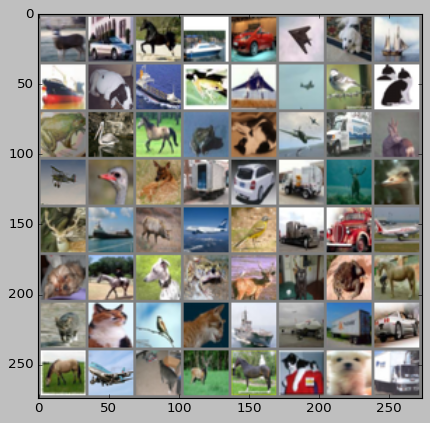

In [ ]:
# get some random training images
dataiter = iter(trainloader)
images, labels = dataiter.next()

# show images
imshow(torchvision.utils.make_grid(images))
# print labels
print(' '.join('%5s' % classes[labels[j]] for j in range(4)))

### Линейная модель классификации

Зададим самую простую — линейную модель. Для задания модели достаточно создать класс, унаследованный от nn.Module и выполняющий инициализацию родительского класса.

Далее необходимо задать функцию forward — процесс прямого прохода в сети. .backward будет реализован автоматически. 

In [ ]:
image_size = images[0].shape

In [ ]:
class Net(nn.Module):
    def __init__(self, feature_size, n_classes=10):
        super(Net, self).__init__()
        self.feature_size = #
        self.fc1 = #

    def forward(self, x):
        pass

In [ ]:
net = #создать сеть
net = #послать на гпу

Задание метода оптимизации и функции потерь:

In [ ]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(net.parameters(), lr=1e-3, momentum=0.9, weight_decay=1e-4)

Функция для оценивания качества:

In [ ]:
def evaluate_net(net, testloader, use_cuda=True):
    net = net.eval()
    
    #обнуляем счетчики

    
    with torch.no_grad():
        for data in testloader:
            images, labels = data
            
            #перекидываем на куду
            
            outputs = #предсказания
            _, predicted = #
            
            #увеличиваем счетчики
    
    mean_loss = #
    accuracy = #
    
    return mean_loss, accuracy

In [ ]:
def class_evaluation(net, testloader, use_cuda=True):
    net = net.eval()
    
    class_correct = list(0. for i in range(10))
    class_total = list(0. for i in range(10))
    
    with torch.no_grad():
        for data in testloader:
            images, labels = data
            
            if use_cuda:
                images = images.cuda()
            
            outputs = net(images).cpu()
            
            _, predicted = torch.max(outputs.data, 1)
            c = (predicted == labels).squeeze()
            for i in range(10):
                label = labels[i]
                class_correct[label] += c[i]
                class_total[label] += 1

    class_correct = [
        float(x)
        for x in class_correct
    ]

    for i in range(10):
        print('Accuracy of %5s : %2d %%' % (
            classes[i], 100 * class_correct[i] / class_total[i]))

In [ ]:
def plt_graphics(verbose_data):
    plt.clf()
    display.clear_output(wait=True)
    display.display(plt.gcf())

    fig, ax = plt.subplots(1, 2)
    fig.set_figwidth(15)

    plt.subplot(1, 2, 1)
    plt.plot(verbose_data['train_verbose_steps'],
             verbose_data['train_loss'], 'b', linewidth=2)
    plt.plot(verbose_data['test_verbose_steps'],
             verbose_data['test_loss'], 'r', linewidth=2)
    plt.legend(['train', 'test'], fontsize=14)

    plt.xlabel('epoch', fontsize=14)
    plt.ylabel('loss', fontsize=14)
    plt.yticks(fontsize=12)
    plt.xticks(fontsize=12)
    
    plt.grid()

    plt.subplot(1, 2, 2)
    plt.plot(verbose_data['test_verbose_steps'],
             verbose_data['test_accuracy'], 'r', linewidth=2)
    plt.xlabel('epoch', fontsize=14)
    plt.ylabel('accuracy', fontsize=14)
    plt.yticks(fontsize=12)
    plt.xticks(fontsize=12)

    plt.grid()
    plt.show()

verbose через print:

In [ ]:
def optimize_net(n_epochs, net, trainloader, optimizer, criterion,
                 use_cuda=True, verbose=True, batch_verbose_proportion=0.5):
    net = net.train()
    
    n_batches = len(trainloader)
    n_batches_for_verbose = int(n_batches * batch_verbose_proportion)    
    
    # loop over the dataset multiple times
    for epoch in range(n_epochs):  
        
        #zero running_loss
        for i, data in ###?:
            # get the inputs
            

            if use_cuda:
                inputs = inputs.cuda()
                labels = labels.cuda()

            # zero the parameter gradients

            # forward + backward + optimize

            # print statistics
            running_loss += float(loss)

                    
                
        if verbose:
            test_loss, test_accuracy = evaluate_net(net, testloader)
            print(
                '[{}] test_accuracy: {:.3f}, test_loss: {:.3f}'
                .format(epoch + 1, test_accuracy, test_loss)
            )
            print('------------------------------')
    
    if verbose:
        print('Finished Training')

verbose через графики:

In [ ]:
def optimize_net(n_epochs, net, optimizer, criterion,
                 trainloader, testloader,
                 use_cuda=True, verbose=True, batch_verbose_proportion=0.5, 
                 verbose_data=None):
    net = net.train()
    
    n_batches = len(trainloader)
    n_batches_for_verbose = int(n_batches * batch_verbose_proportion)    
    
    
    if verbose_data is None:
        verbose_data = {
            'train_verbose_steps': [],
            'train_loss': [],
            'test_verbose_steps': [],
            'test_loss': [],
            'test_accuracy': [],
        }
    
    # loop over the dataset multiple times
    for epoch in range(n_epochs):  
        running_loss = 0.0
        total_objects = 0
        
        for i, data in enumerate(trainloader, 0):
            # get the inputs
            inputs, labels = data
        
            # move data to cuda if need
            if use_cuda:
                inputs = inputs.cuda()
                labels = labels.cuda()

            # zero the parameter gradients
            optimizer.zero_grad()

            # forward + backward + optimize
            outputs = net(inputs)
            loss = criterion(outputs, labels)

            loss.backward()
            optimizer.step()

            # print statistics
            running_loss += float(loss)
            total_objects += outputs.shape[0]
            
            
            # save info sometimes
            if i % n_batches_for_verbose == n_batches_for_verbose - 1:
                epoch_value = epoch + np.around(i / n_batches, 2)
                new_train_loss = running_loss / total_objects
                running_loss = 0
                total_objects = 0
                
                verbose_data['train_verbose_steps'].append(epoch_value)
                verbose_data['train_loss'].append(new_train_loss * 100)            
                
                if verbose:
                    plt_graphics(verbose_data)
                
        # save info about test 
        test_loss, test_accuracy = evaluate_net(net, testloader)
        verbose_data['test_verbose_steps'].append(epoch + 1)
        verbose_data['test_loss'].append(test_loss * 100)
        verbose_data['test_accuracy'].append(test_accuracy * 100)
            
        if verbose:
            plt_graphics(verbose_data)
            
    return verbose_data

Обучение мультиномиальной регрессии (несколько эпох):

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

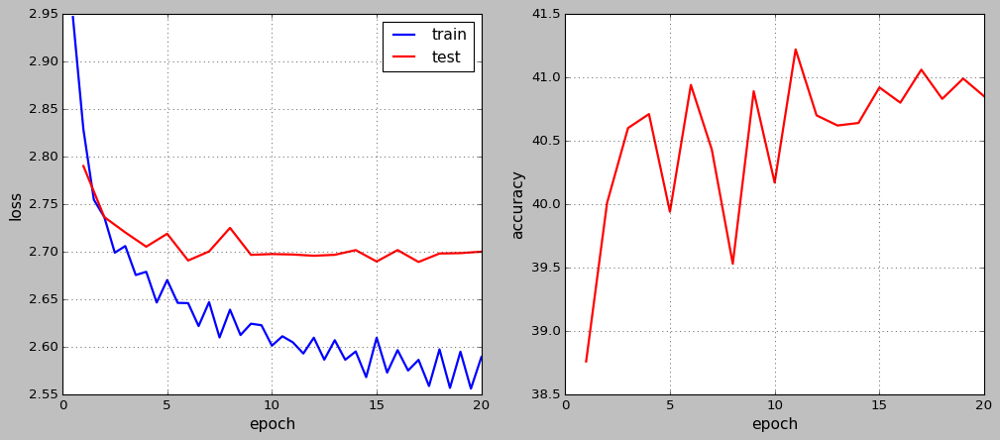

In [ ]:
linear_net_data = ###оптимизируем сеть

In [ ]:
max(linear_net_data['test_accuracy'])

41.22

In [ ]:
class_evaluation(net, testloader)

Accuracy of plane : 53 %
Accuracy of   car : 58 %
Accuracy of  bird : 31 %
Accuracy of   cat : 19 %
Accuracy of  deer : 21 %
Accuracy of   dog : 33 %
Accuracy of  frog : 37 %
Accuracy of horse : 42 %
Accuracy of  ship : 60 %
Accuracy of truck : 47 %


Сеть учится (значение функции потерь уменьшается), но переобучается (начиная с некоторого момента функция потерь на тесте не изменяется, хотя на обучении уменьшается). Линейная модель - слишком простая архитектура для задачи классификации изображений, никак не учитывающая особенность изображений (например то, что соседние пиксели сильно связаны друг с другом).

### LeNet для классификации

Попробуем использовать для классификации свёрточные сети. Для начала рассмотрим очень простую архитектуру LeNet.

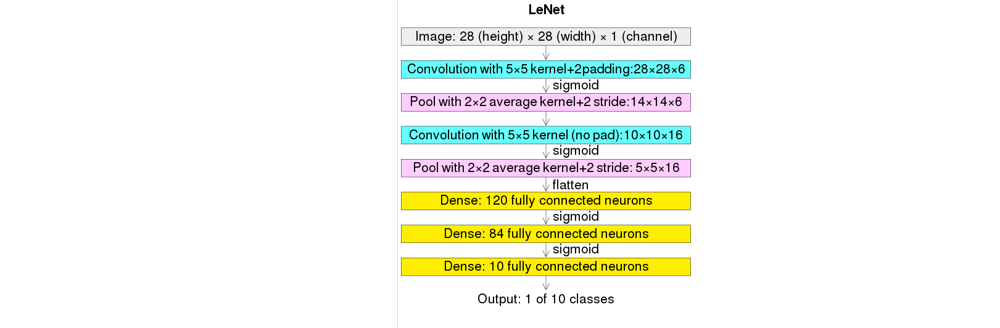

In [ ]:
class Net(nn.Module):
    def __init__(self, n_classes):
        super(Net, self).__init__()
        


    def forward(self, x):
        batch_size = x.shape[0]
        

        return x

Альтернативная запись этой же сети:

In [ ]:
class Net(nn.Module):
    def __init__(self, n_classes):
        super(Net, self).__init__()
        
        self.conv_block_1 = nn.Sequential(
            nn.Conv2d(3, 6, 5),
            nn.MaxPool2d(2, 2),
            nn.ReLU(),
        )
        
        self.conv_block_2 = nn.Sequential(
            nn.Conv2d(6, 16, 5),
            nn.MaxPool2d(2, 2),
            nn.ReLU(),
        )
        
        self.fc_layers = nn.Sequential(
            nn.Linear(16 * 5 * 5, 120),
            nn.ReLU(),
            nn.Linear(120, 84),
            nn.ReLU(),
            nn.Linear(84, n_classes),
        )
        
    def forward(self, x):
        batch_size = x.shape[0]
        
        x = self.conv_block_1(x)
        x = self.conv_block_2(x)
        
        x = x.view(batch_size, -1)
        x = self.fc_layers(x)

        return x

In [ ]:
net = Net(n_classes=10)
net = net.cuda()

In [ ]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(net.parameters(), lr=1e-3, weight_decay=1e-4)

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

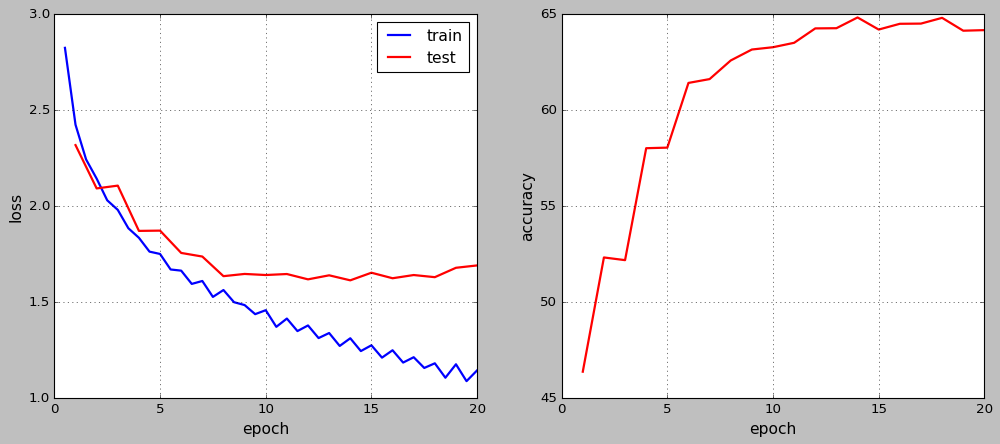

In [ ]:
lenet_base_data = optimize_net(
    20, net, optimizer, criterion,
    trainloader, testloader,
    use_cuda=True, verbose=True
)

In [ ]:
max(lenet_base_data['test_accuracy'])

64.82

Сеть сильно переобучается. Попробуем чуть-чуть улучшить результат, используя Dropout:

In [ ]:
class Net(nn.Module):
    def __init__(self, n_classes):
        super(Net, self).__init__()
        
        self.conv_block_1 = nn.Sequential(
            nn.Conv2d(3, 6, 5),
            nn.MaxPool2d(2, 2),
            nn.ReLU(),
        )
        
        self.conv_block_2 = nn.Sequential(
            nn.Conv2d(6, 16, 5),
            nn.MaxPool2d(2, 2),
            nn.ReLU(),
        )
        
        self.fc_layers = nn.Sequential(
            nn.Linear(16 * 5 * 5, 120),
            nn.ReLU(),
            nn.Dropout(0.25),
            nn.Linear(120, 84),
            nn.ReLU(),
            nn.Dropout(0.25),
            nn.Linear(84, n_classes),
        )
        
    def forward(self, x):
        batch_size = x.shape[0]
        
        x = self.conv_block_1(x)
        x = self.conv_block_2(x)
        
        x = x.view(batch_size, -1)
        x = self.fc_layers(x)

        return x

In [ ]:
net = Net(n_classes=10)
net = net.cuda()

In [ ]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(net.parameters(), lr=1e-3, weight_decay=1e-4)

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

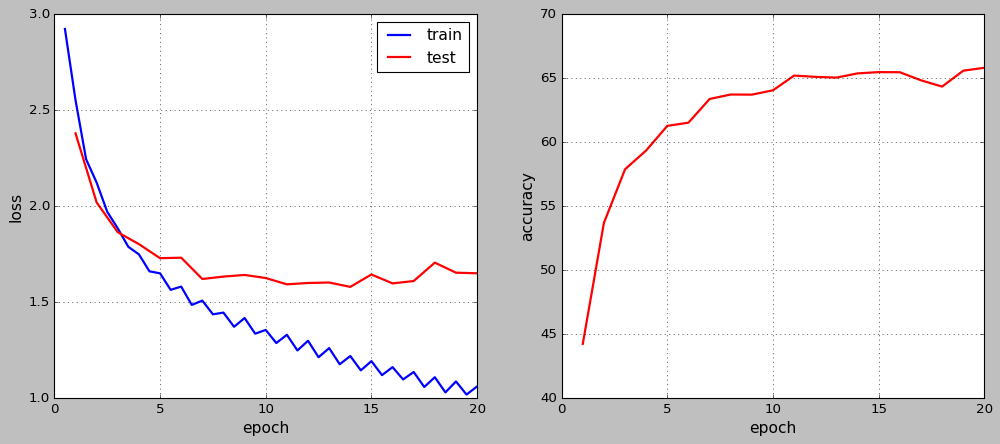

In [ ]:
lenet_dropout_data = optimize_net(
    20, net, optimizer, criterion,
    trainloader, testloader,
    use_cuda=True, verbose=True
)

In [ ]:
max(lenet_dropout_data['test_accuracy'])

65.8

In [ ]:
class_evaluation(net, testloader)

Accuracy of plane : 80 %
Accuracy of   car : 62 %
Accuracy of  bird : 55 %
Accuracy of   cat : 36 %
Accuracy of  deer : 52 %
Accuracy of   dog : 57 %
Accuracy of  frog : 75 %
Accuracy of horse : 60 %
Accuracy of  ship : 75 %
Accuracy of truck : 74 %


LeNet — очень простая архитектура. Если мы хотим получить хорошее качество, нужно использовать что-то посложнее (например, взять модель из torchvision.models), а также использовать аугментацию данных. Другой путь улучшения результата — использование предобученной сети и дообучение линейного слоя.

### Предобученный ResNet18

In [ ]:
from torchvision.models import resnet18

In [ ]:
resnet_model = resnet18(pretrained=True)

In [ ]:
resnet_model

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

Будем оптимизировать только последний слой в сети:

In [ ]:
for parameter in resnet_model.parameters():
    parameter.requires_grad = False

In [ ]:
resnet_model.fc = nn.Linear(512, 10)

Так, как ResNet18 обучался на картинках другого размера, необходимо изменить размер наших картинок.

In [ ]:
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        
        self.resnet_block = resnet_model
        
    def forward(self, x):
        batch_size = x.shape[0]
        
        x = nn.functional.interpolate(x, scale_factor=8)
        x = self.resnet_block(x)

        return x

In [ ]:
net = Net().cuda()

In [ ]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(net.parameters(), lr=1e-3, momentum=0.9)

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

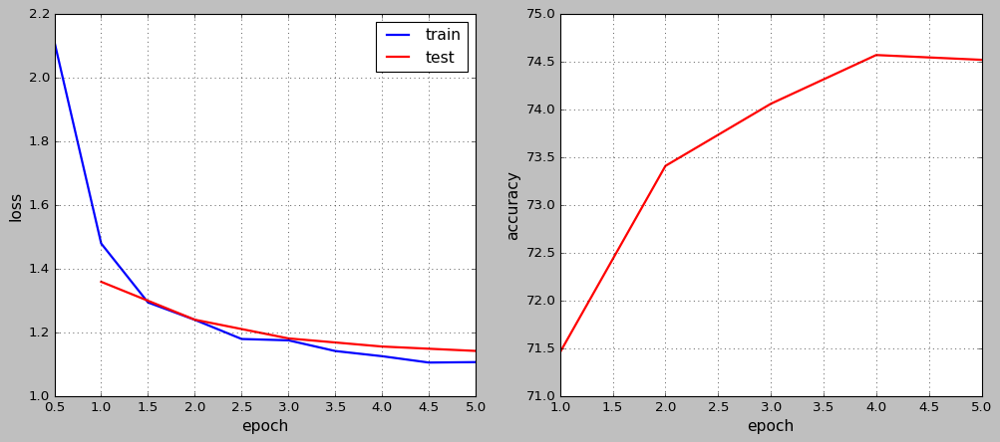

In [ ]:
resnet_pretrained_data = optimize_net(
    5, net, optimizer, criterion,
    trainloader, testloader,
    use_cuda=True, verbose=True
)

In [ ]:
max(resnet_pretrained_data['test_accuracy'])

74.57000000000001

## Заморозка слоев

In [ ]:
from torchvision import models

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [ ]:
transform = transforms.Compose(
    [transforms.Resize((224, 224)),
     transforms.ToTensor(),
     transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])
trainset = torchvision.datasets.CIFAR10(root='./data', train=True,
                                        download=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=32,
                                          shuffle=True)
testset = torchvision.datasets.CIFAR10(root='./data', train=False,
                                       download=True, transform=transform)
testloader = torch.utils.data.DataLoader(testset, batch_size=32,
                                         shuffle=False)

  0%|          | 0/170498071 [00:00<?, ?it/s]

Extracting ./data/cifar-10-python.tar.gz to ./data
Files already downloaded and verified


In [ ]:
vgg16 = models.vgg16(pretrained=True)
vgg16.to(device)
print(vgg16)

/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [ ]:
# change the number of classes 
vgg16.classifier[6].out_features = 10
# freeze convolution weights
for param in vgg16.features.parameters():
    param.requires_grad = False

In [ ]:
# optimizer
optimizer = optim.SGD(vgg16.classifier.parameters(), lr=0.001, momentum=0.9)
# loss function
criterion = nn.CrossEntropyLoss()

In [ ]:
def validate(model, test_dataloader):
    model.eval()
    val_running_loss = 0.0
    val_running_correct = 0
    for int, data in enumerate(test_dataloader):
        data, target = data[0].to(device), data[1].to(device)
        output = model(data)
        loss = criterion(output, target)
        
        val_running_loss += loss.item()
        _, preds = torch.max(output.data, 1)
        val_running_correct += (preds == target).sum().item()
    
    val_loss = val_running_loss/len(test_dataloader.dataset)
    val_accuracy = 100. * val_running_correct/len(test_dataloader.dataset)
    
    return val_loss, val_accuracy

In [ ]:
# training function
def fit(model, train_dataloader):
    model.train()
    train_running_loss = 0.0
    train_running_correct = 0
    for i, data in enumerate(train_dataloader):
        data, target = data[0].to(device), data[1].to(device)
        optimizer.zero_grad()
        output = model(data)
        loss = criterion(output, target)
        train_running_loss += loss.item()
        _, preds = torch.max(output.data, 1)
        train_running_correct += (preds == target).sum().item()
        loss.backward()
        optimizer.step()
    train_loss = train_running_loss/len(train_dataloader.dataset)
    train_accuracy = 100. * train_running_correct/len(train_dataloader.dataset)
    print(f'Train Loss: {train_loss:.4f}, Train Acc: {train_accuracy:.2f}')
    
    return train_loss, train_accuracy

In [ ]:
import time

In [ ]:
train_loss , train_accuracy = [], []
val_loss , val_accuracy = [], []
start = time.time()
for epoch in range(10):
    train_epoch_loss, train_epoch_accuracy = fit(vgg16, trainloader)
    val_epoch_loss, val_epoch_accuracy = validate(vgg16, testloader)
    train_loss.append(train_epoch_loss)
    train_accuracy.append(train_epoch_accuracy)
    val_loss.append(val_epoch_loss)
    val_accuracy.append(val_epoch_accuracy)
end = time.time()
print((end-start)/60, 'minutes')

Train Loss: 0.0256, Train Acc: 73.33
Train Loss: 0.0149, Train Acc: 83.25
Train Loss: 0.0117, Train Acc: 86.87
Train Loss: 0.0094, Train Acc: 89.52
Train Loss: 0.0074, Train Acc: 91.78
Train Loss: 0.0057, Train Acc: 93.65
Train Loss: 0.0043, Train Acc: 95.26
Train Loss: 0.0031, Train Acc: 96.72
Train Loss: 0.0023, Train Acc: 97.61
Train Loss: 0.0017, Train Acc: 98.28
60.66720162630081 minutes


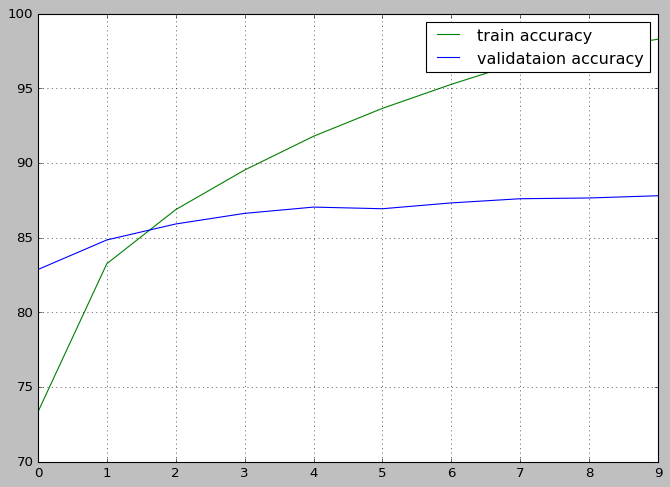

In [ ]:
plt.figure(figsize=(10, 7))
plt.plot(train_accuracy, color='green', label='train accuracy')
plt.plot(val_accuracy, color='blue', label='validataion accuracy')
plt.legend()
plt.savefig('accuracy.png')
plt.grid()
plt.show()